# Results summary


## Setup - this shouldn't be changed, only re-executed if need be

### Clone, update and import the repo

In [0]:
repo_name = "uj_cv_course"
repo_url = f"https://github.com/mprzewie/{repo_name}"
!if [ -d $repo_name ]; then rm -Rf $repo_name; fi
!git clone $repo_url
import sys
if repo_name not in sys.path:
  sys.path.append(repo_name)


Cloning into 'uj_cv_course'...
remote: Enumerating objects: 233, done.
remote: Counting objects: 100% (233/233), done.
remote: Compressing objects: 100% (167/167), done.
remote: Total 233 (delta 117), reused 172 (delta 59), pack-reused 0
Receiving objects: 100% (233/233), 2.00 MiB | 27.32 MiB/s, done.
Resolving deltas: 100% (117/117), done.


### Install the dependencies

`requirements.txt` from the repo should be our source of truth regarding package versions.

In [0]:
!pip install -r uj_cv_course/requirements.txt
import os
os.kill(os.getpid(), 9) #restart runtima - konieczny aby załadować poprawnie powyższe paczki

     |████████████████████████████████| 61kB 2.0MB/s 
     |████████████████████████████████| 2.1MB 8.5MB/s 
     |████████████████████████████████| 6.7MB 31.4MB/s 
     |████████████████████████████████| 25.2MB 128kB/s 
     |████████████████████████████████| 163kB 48.8MB/s 
     |████████████████████████████████| 10.1MB 25.0MB/s 
  Created wheel for efficientnet-pytorch: filename=efficientnet_pytorch-0.5.1-cp36-none-any.whl size=11768 sha256=503804629930ad4335e1d01330017bac1ffeaa8d4231094002a327994aa7335b
  Stored in directory: /root/.cache/pip/wheels/52/0c/8e/58d91f29f0f8cbb45231a145312939a5423dc82c61cc731361
Successfully built efficientnet-pytorch
ERROR: torchvision 0.4.1 has requirement torch==1.3.0, but you'll have torch 1.3.1 which is incompatible.
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
  Found existing installation: tqdm 4.28.1
    Uninstalling tqdm-4.28.1:
      Successfully uninstalled tqdm-4.28.1

In [0]:
# this autoreloads the code
%load_ext autoreload
%autoreload 2

### Mount the google drive with data

In [0]:
from google.colab import drive
from pathlib import Path
mnt_path = "/content/drive/"
# print("4/")
drive.mount(mnt_path)
# !ls /content/drive
# print(list())
project_path = Path('/content/drive/My Drive/ANN/RO/Projekt/uj_cv_course')#list(Path(mnt_path).glob("*/uj_cv_course/"))[0]
data_path = project_path / "data_pickled"


train_path = data_path / "train_1_ids_no_transform.pkl"
test_path = data_path / "test_1_ids_no_transform.pkl"
train_path, test_path

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


(PosixPath('/content/drive/My Drive/ANN/RO/Projekt/uj_cv_course/data_pickled/train_1_ids_no_transform.pkl'),
 PosixPath('/content/drive/My Drive/ANN/RO/Projekt/uj_cv_course/data_pickled/test_1_ids_no_transform.pkl'))

## Experiments start here



In [0]:
%cd '/content/uj_cv_course'
import torch
from project.utils.ds.dataset import BoxedExamplesDataset, transform_chain, LazyMaskedExamplesDataset
from project.utils.ds import transforms as tr
from project.utils.ds.images import is_grayscale
import numpy as np
from torchvision.transforms import Compose
from project.utils.ds.dataset import transform_chain
import numpy as np
from torchvision import transforms as trtv
import matplotlib.pyplot as plt
import json
from tqdm import tqdm

/content/uj_cv_course


### Load the datasets

In [0]:
def crop_to_exact_size(example, x_size, y_size, retries = 10):    
  w, h = example.image.size
  c_w = x_size / w
  c_h = y_size / h
  assert c_w <= 1
  assert c_h <= 1

  x_min = np.random.uniform(0, 1 - c_w)
  y_min = np.random.uniform(0, 1 - c_h)

  res = tr.crop(
      example,
      x_min,
      y_min,
      x_min + c_w,
      y_min + c_h 
      
  )
  return res


def normalize(ex):
  i, l = ex
  return trtv.Normalize([0.2, 0.2, 0.2], [0.5, 0.5, 0.5])(i), l

In [0]:

from project.utils.ds import transforms as tr
from project.utils.ds import random_transforms as rnd

transform_chain = [
    tr.to_grayscale,
    tr.flip_color_on_intensity_heuristic,
    tr.max_pixel_to_255,
    # rnd.random_transform(tr.rotate, rnd.rotate_90_sampler()),
    # rnd.random_transform(tr.rotate, rnd.rotate_sampler(amplitude=10)),
    tr.resize_to_min_300,
    tr.to_rgb,
    # rnd.random_transform(tr.crop, rnd.constant_crop_size_sampler(crop_size=256/300)),
    lambda ex: crop_to_exact_size(ex, 300, 300),

]

In [0]:
def retransform(ex, transform, retries=None):
  if retries is not None and retries < 0:
    raise ValueError(ex.name)
  ex_tran = transform(ex)
  if len(ex_tran.boxes) == 0:
    return retransform(ex, transform, retries-1 if retries is not None else None)
  return ex_tran

In [0]:
import pickle

with train_path.open("rb") as f:
  ds = pickle.load(f)

with test_path.open("rb") as f:
  ds_test = pickle.load(f)

ds.examples = [ex for ex in ds.examples if not ex.name.startswith("7b38")]

len(ds), len(ds_test)

(669, 65)

In [0]:
any(
    len(ex.boxes) == 0
    for ex in ds
)

False

#### Visualize some examples

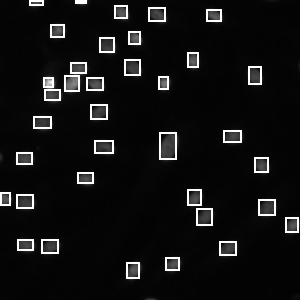

In [0]:
ex = ds.examples[1]

ex = Compose(transform_chain)(ex)

ex.vis_boxes()

In [0]:
# evaluation utils
def gather_metrics(
    model, dl_train, dl_val, device, max_n_batches=5
):

  coco_train = tv_rcnn.coco_eval_metrics(evaluate(
    model, dl_train, device
  )
)
  coco_val = tv_rcnn.coco_eval_metrics(
      evaluate(
        model, dl_val, device
      )
  )


  losses_train = tv_rcnn.evaluate_for_losses(
      model, dl_train, device, max_n_batches=max_n_batches
  )
  losses_val = tv_rcnn.evaluate_for_losses(
      model, dl_val, device, max_n_batches=max_n_batches
  )

  return dict(
    train=dict(
        **losses_train,
        **coco_train
    ),
    val=dict(
        **losses_val,
        **coco_val
    )
)

def plot_metrics_histories(
    history, # List[Dict[str, float]],
):
  metric_names = history[0]["train"].keys()
  print(list(metric_names))
  fig, axes = plt.subplots(len(metric_names), figsize=(10, len(metric_names) * 10) )

  epochs_inds = list(range(len(history)))

  for i, metric_name in enumerate(metric_names):
    ax = axes[i]

    for fold in ["train", "val"]:
      ax.plot(
        epochs_inds, 
        [
        h[fold][metric_name] for h in history
        ],
        label=fold
      )
      ax.set_title(metric_name)
      ax.legend()
  return fig

def visualize_example_result(
    example_original,
    example_input, example_output,
    epoch=None
):

  h, w = example_original.image.size
  size = max(h, w)
  thickness = int(size // 150)

  fig, ax = plt.subplots(2, 2, figsize=(10,10))
  ax[0,0].imshow(example_original.vis_boxes(thickness=thickness))
  ax[0,0].set_title(f"{example_original.id} {example_original.name[:10]} original")

  ax[1, 0].imshow(example_input.vis_boxes(thickness=thickness))
  ax[1, 0].set_title("input to model with boxes ")

  ax[0, 1].imshow(example_input.image)
  ax[0, 1].set_title("input to model w/o boxes")

  ax[1, 1].imshow(example_output.vis_boxes(thickness=thickness))
  ax[1,1].set_title(f"epoch {epoch} model output")
  return fig


## Summarize the results

In [0]:
%cd /content/uj_cv_course/
from torchvision.models.detection import fasterrcnn_resnet50_fpn
from project.utils.models import tv_rcnn
from torch.optim import Adam
from torchvision.models.detection.rpn import AnchorGenerator
from torch.utils.data import DataLoader

from project.utils.tv_det_ref import utils
from project.utils.tv_det_ref.engine import train_one_epoch, evaluate
from project.utils.ds.dataset import BoxedExamplesDataset

/content/uj_cv_course


In [0]:
example_transform = lambda ex: retransform(ex, Compose(transform_chain), None)
to_model = Compose([
  tv_rcnn.to_model_input,
  normalize,
])


total_transform = Compose([
  example_transform,
  to_model
])


ds_train = BoxedExamplesDataset(
    ds.examples[:600],
    total_transform
)
ds_val = BoxedExamplesDataset(
    ds.examples[600:],
    total_transform
)


dl_train, dl_val = [torch.utils.data.DataLoader(
        ds_, batch_size=4, shuffle=True, #batch_sampler=torch.utils.data.BatchSampler(torch.utils.data.RandomSampler(ds_), 16),
        collate_fn=utils.collate_fn
)
for ds_ in [ds_train, ds_val]
]


len(ds_train), len(ds_val), len(ds)

(600, 69, 669)

In [0]:
val_inds = [int(l["image_id"].item()) for (i, l) in ds_val]

ds_test.transform = trtv.Compose([
      tr.to_grayscale,
      tr.flip_color_on_intensity_heuristic,
      tr.max_pixel_to_255,
      tr.to_rgb,
      tv_rcnn.to_model_input
  ])

dl_test_unaugmented = torch.utils.data.DataLoader(
        ds_test, batch_size=1,
        collate_fn=utils.collate_fn
)

In [0]:
from project.utils.models.efficientnet import faster_rcnn_efficientnet_fpn

def get_resnet():
  anchors = AnchorGenerator(
      sizes=(4, 8, 16, 32, 64, 128, 256)
  )
  return fasterrcnn_resnet50_fpn(
    pretrained=False, 
    num_classes=2, #możliwe że wystarczy jedna klasa (zależy od implementacji fpn - w retinie automatycznie dodawano klasę null) #nope, nie wystarczy
    pretrained_backbone=True,
    rpn_anchor_generator=anchors
  )

def get_efficientnet(backbone_name: str = "efficientnet-b0"):
  anchors = AnchorGenerator(
      sizes=(8, 16, 32, 64, 128, 256)
  )
  return faster_rcnn_efficientnet_fpn(
    backbone_name,
    rpn_anchor_generator=anchors
)



Downloading: "http://storage.googleapis.com/public-models/efficientnet/efficientnet-b7-dcc49843.pth" to /root/.cache/torch/checkpoints/efficientnet-b7-dcc49843.pth
100%|██████████| 254M/254M [00:01<00:00, 143MB/s]


Loaded pretrained weights for efficientnet-b7


In [0]:
models_dir = project_path / "experiments" / "vis_history"
models_paths = {
  models_dir / "faster_rcnn_unaugmented": get_resnet,
  models_dir / "faster_rcnn_rot_augment": get_resnet,
  models_dir / "faster_rcnn_efficientnet_b0_unaugmented": lambda: get_efficientnet("efficientnet-b0"),
  models_dir / "faster_rcnn_efficientnet_b0_rot_augment": lambda: get_efficientnet("efficientnet-b0"),
  models_dir / "faster_rcnn_efficientnet_b1": lambda: get_efficientnet("efficientnet-b1"),
  models_dir / "faster_rcnn_efficientnet_b2": lambda: get_efficientnet("efficientnet-b2"),
  models_dir / "faster_rcnn_efficientnet_b3": lambda: get_efficientnet("efficientnet-b3"),
}

In [0]:
models = dict()

for model_pth, model_fn in models_paths.items():
  latest_state_path = model_pth / "latest_state.pth"
  checkpoint = torch.load(latest_state_path)
  epoch = checkpoint["epoch"]
  hist = checkpoint["loss_history"]
  model = model_fn()
  model.load_state_dict(checkpoint['model_state_dict'])
  models[model_pth.name] = (model, hist)


Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/checkpoints/resnet50-19c8e357.pth
100%|██████████| 97.8M/97.8M [00:01<00:00, 79.2MB/s]
Downloading: "http://storage.googleapis.com/public-models/efficientnet/efficientnet-b0-355c32eb.pth" to /root/.cache/torch/checkpoints/efficientnet-b0-355c32eb.pth
100%|██████████| 20.4M/20.4M [00:00<00:00, 128MB/s] 


Loaded pretrained weights for efficientnet-b0
Loaded pretrained weights for efficientnet-b0


Downloading: "http://storage.googleapis.com/public-models/efficientnet/efficientnet-b1-f1951068.pth" to /root/.cache/torch/checkpoints/efficientnet-b1-f1951068.pth
100%|██████████| 30.1M/30.1M [00:00<00:00, 126MB/s] 


Loaded pretrained weights for efficientnet-b1


Downloading: "http://storage.googleapis.com/public-models/efficientnet/efficientnet-b2-8bb594d6.pth" to /root/.cache/torch/checkpoints/efficientnet-b2-8bb594d6.pth
100%|██████████| 35.1M/35.1M [00:00<00:00, 175MB/s]


Loaded pretrained weights for efficientnet-b2


Downloading: "http://storage.googleapis.com/public-models/efficientnet/efficientnet-b3-5fb5a3c3.pth" to /root/.cache/torch/checkpoints/efficientnet-b3-5fb5a3c3.pth
100%|██████████| 47.1M/47.1M [00:00<00:00, 75.7MB/s]


Loaded pretrained weights for efficientnet-b3


In [0]:
summary_path = project_path / "summary2"
summary_path.mkdir(exist_ok=True, parents=True)

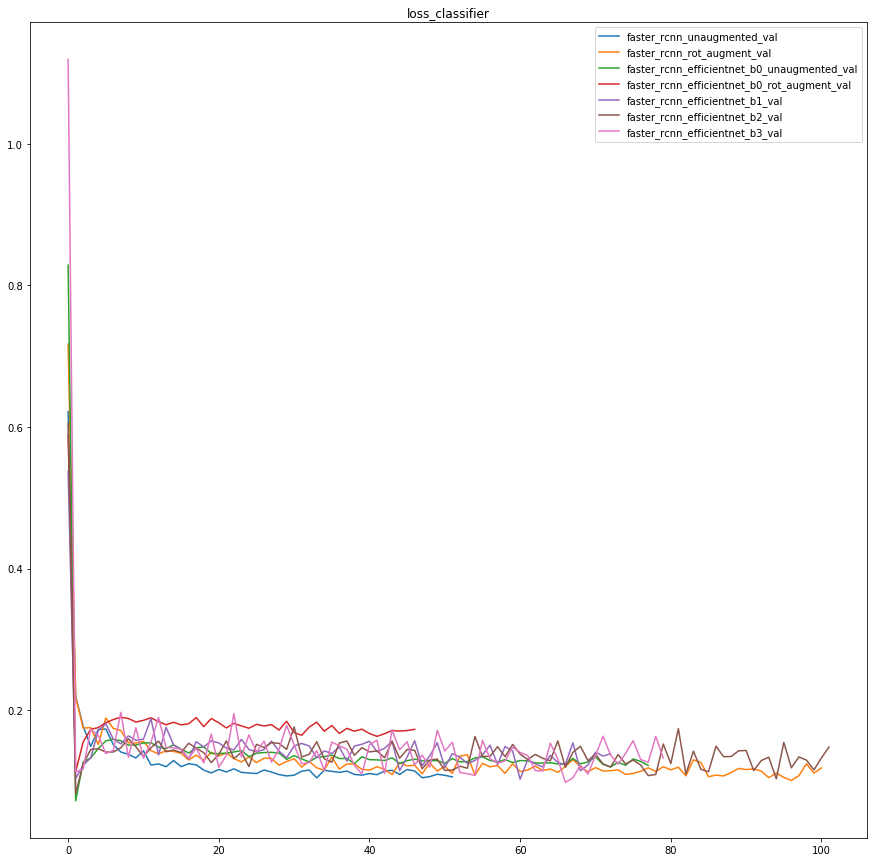

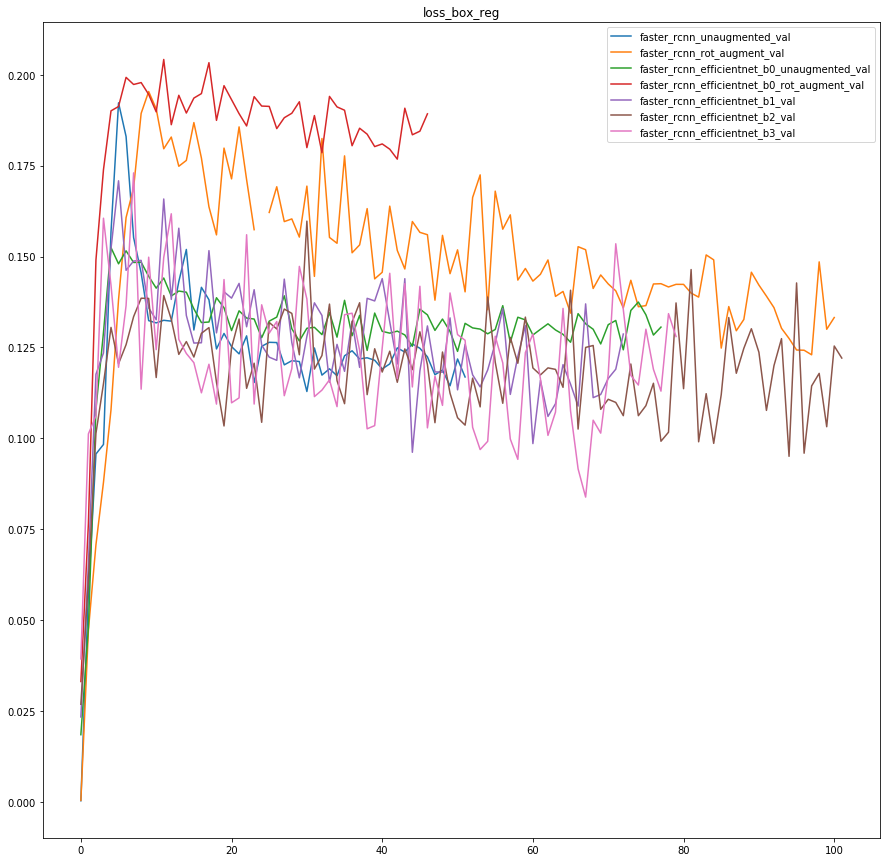

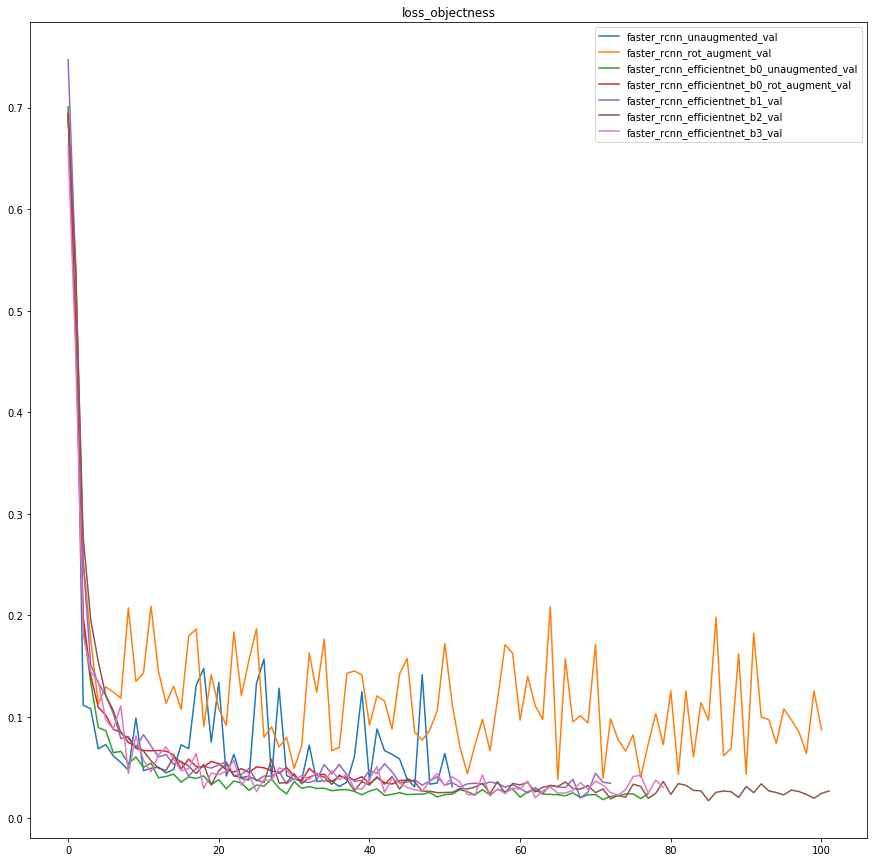

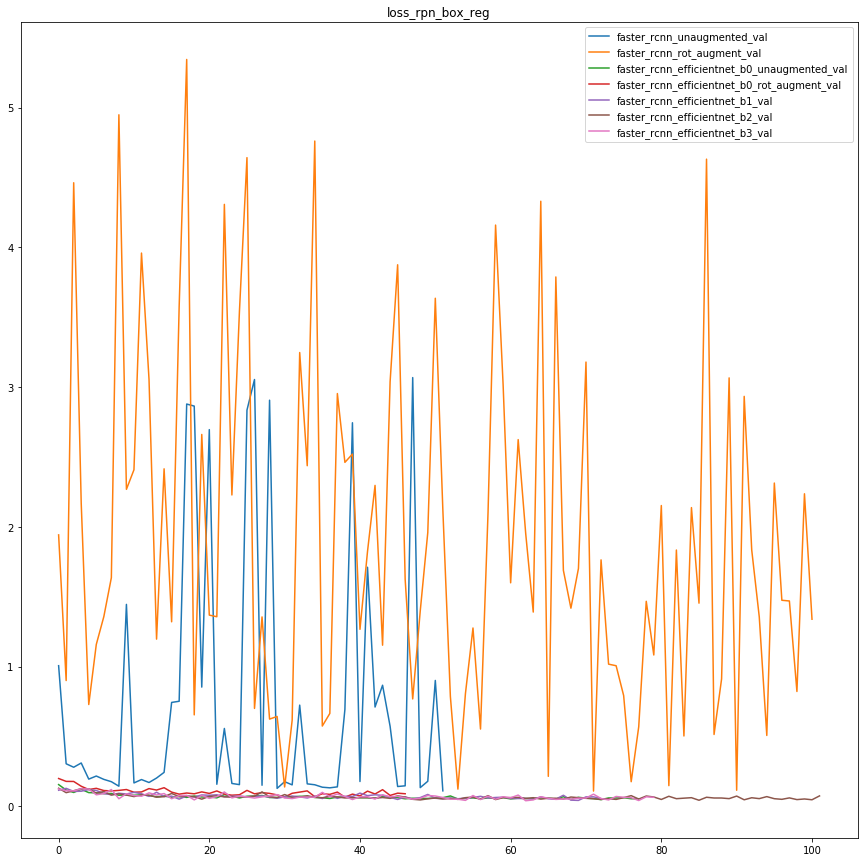

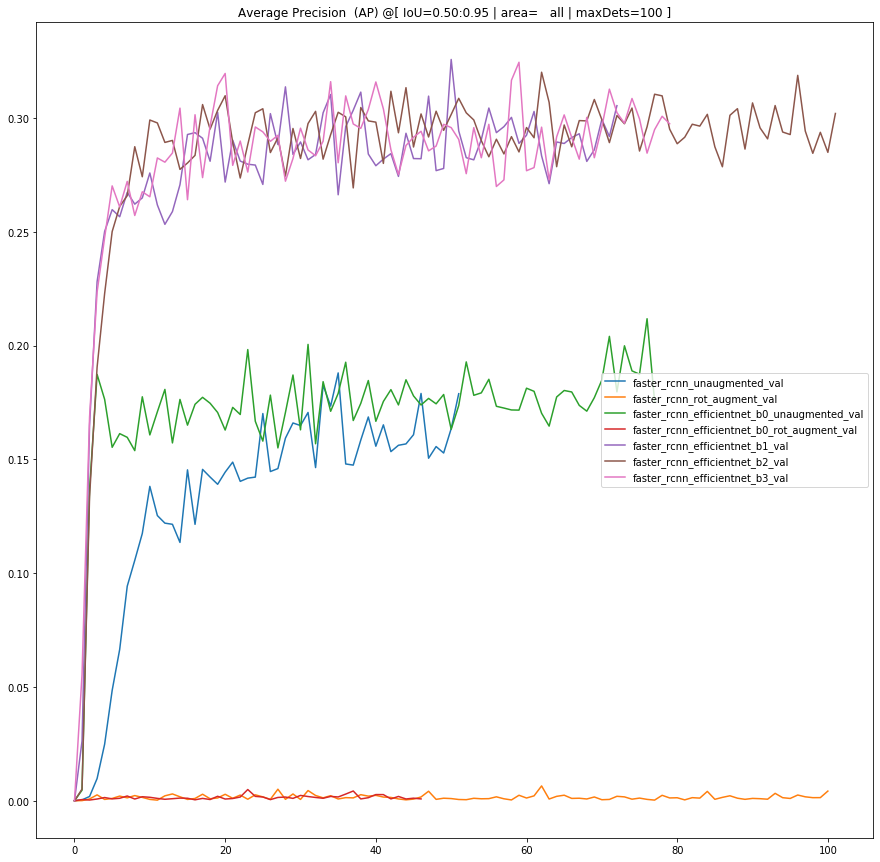

...

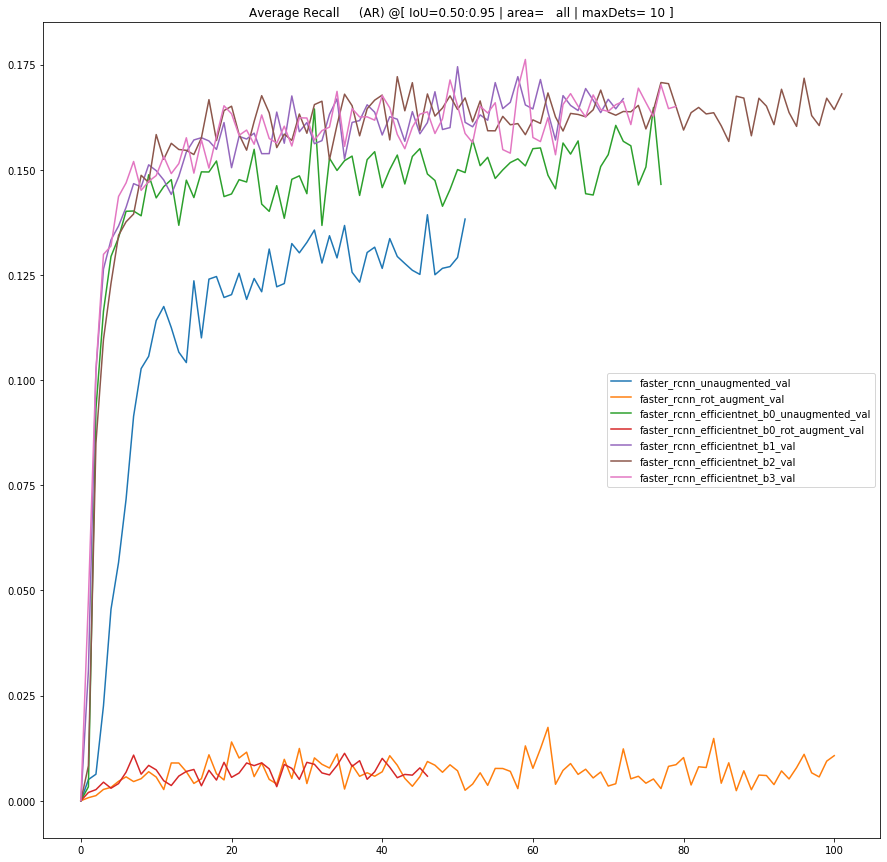

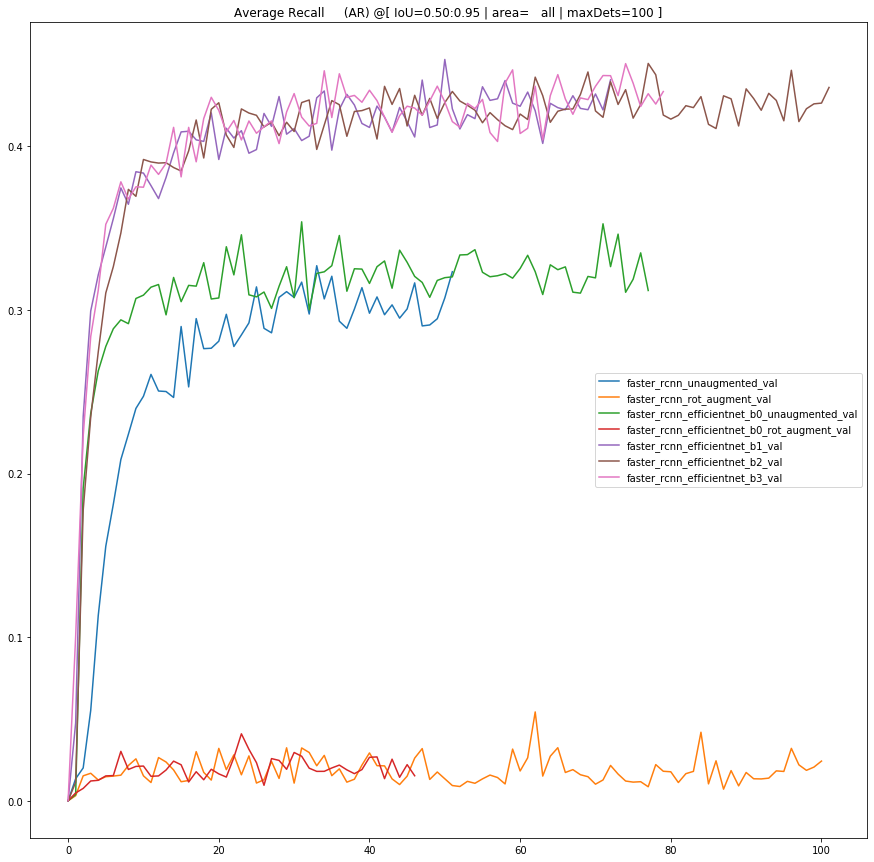

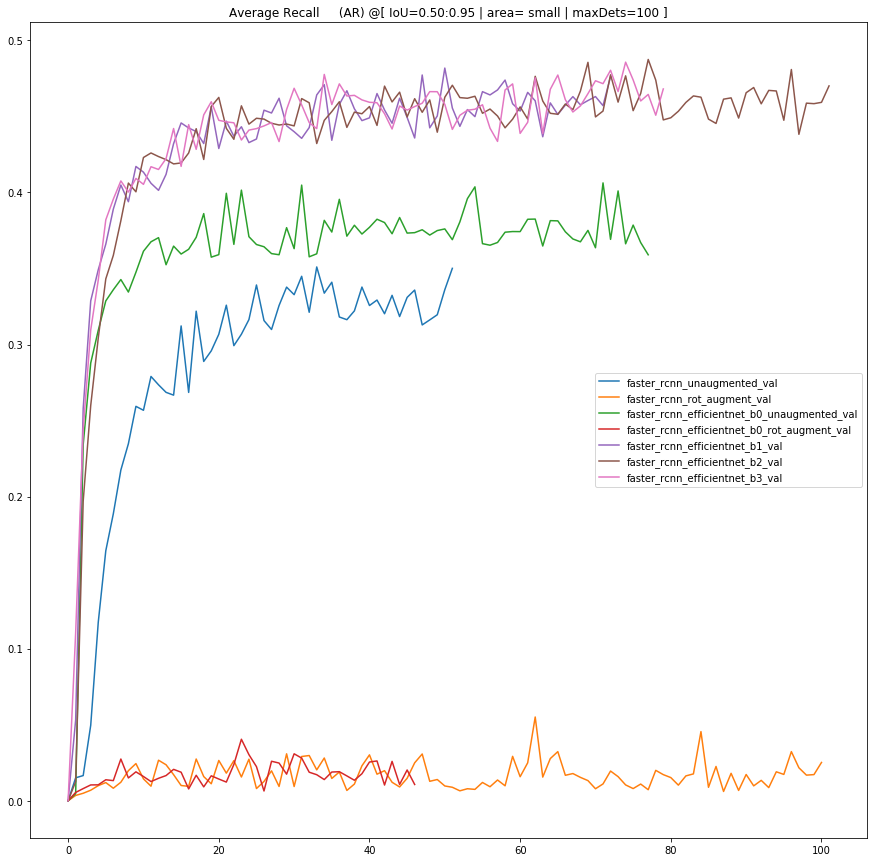

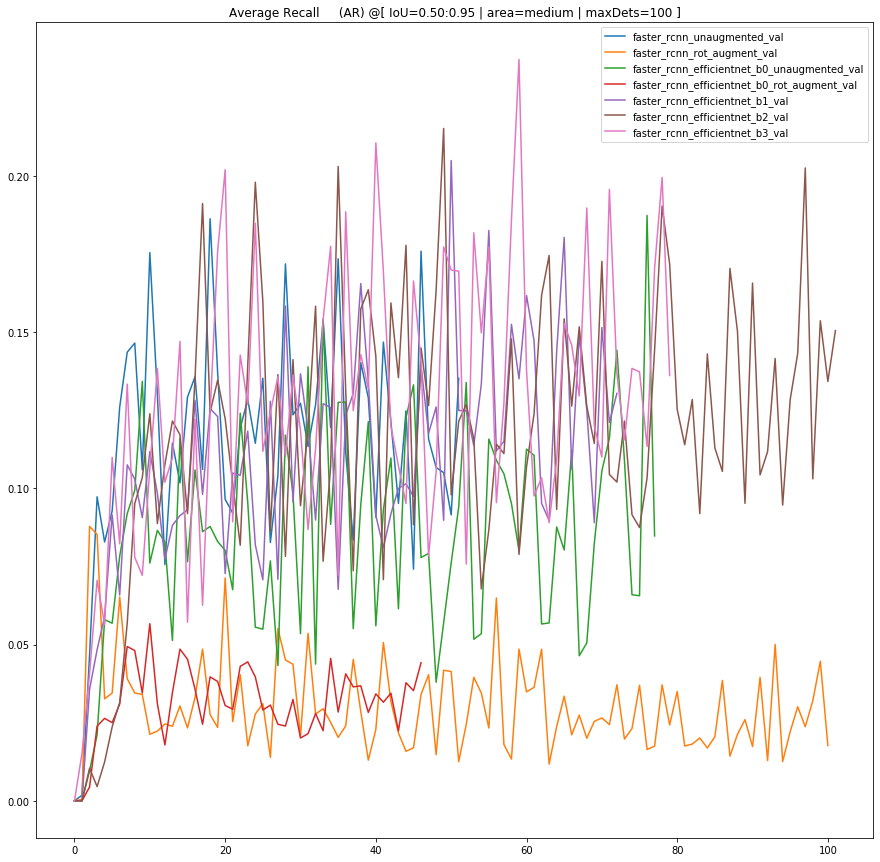

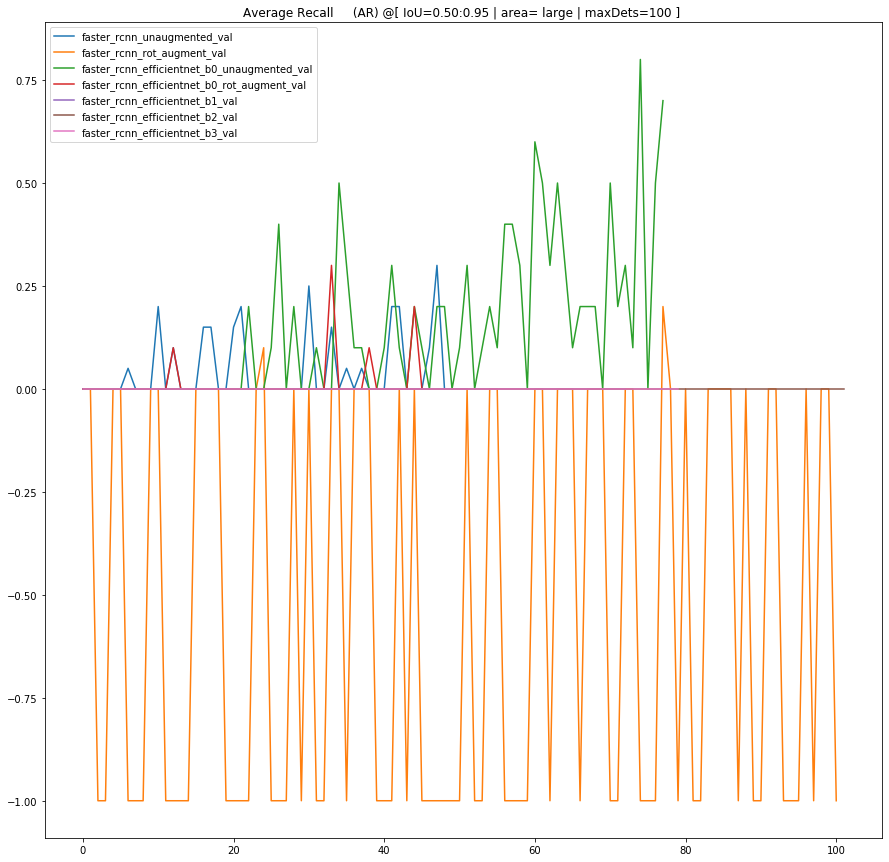

In [0]:
axes = dict()
for model_name, (model, hist) in models.items():
    metric_names = hist[0]["train"].keys()
    epochs_inds = list(range(len(hist)))

    for metric_name in metric_names:
      fig, ax = axes.get(metric_name, (None, None))
      if ax is None:
        fig, ax = plt.subplots(figsize=(15,15))
        axes[metric_name] = (fig, ax)
      for fold in [
                  #  "train", 
                   "val"
                   ]:
        ax.plot(
          epochs_inds, 
          [
          h[fold][metric_name] for h in hist
          ],
          label=f"{model_name}_{fold}"
        )
        ax.set_title(metric_name)
        ax.legend()

for metric_name, (fig, ax) in axes.items():
  fig.savefig(summary_path / f"{metric_name}.png")

In [0]:
test_predictions_path = summary_path / "test_predictions.pkl"

if not test_predictions_path.exists():
  device = torch.device("cpu")
  models_predictions = {
      model_name: tv_rcnn.model_predictions_from_loader(
        model, dl_test_unaugmented, device, max_n_batches=len(ds_test), normalization_transform=trtv.Normalize([0.2, 0.2, 0.2], [0.5, 0.5, 0.5])
      )
      for (model_name, (model, _)) in tqdm(models.items())
  }
  with test_predictions_path.open("wb") as f:
    pickle.dump(models_predictions, f)

with test_predictions_path.open("rb") as f:
  models_predictions = pickle.load(f)

100%|██████████| 7/7 [26:40<00:00, 228.69s/it]


In [0]:
from collections import defaultdict

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:17: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


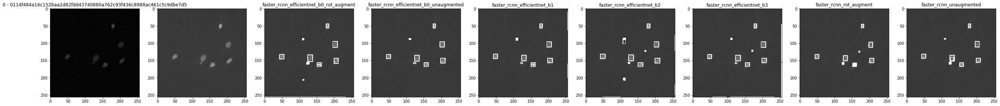

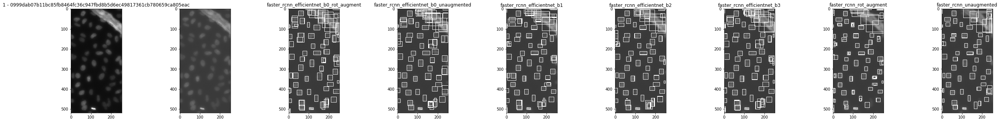

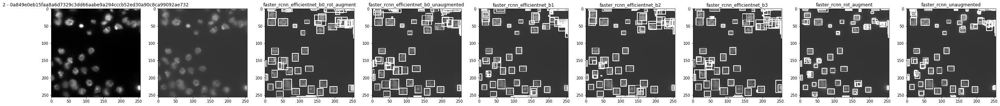

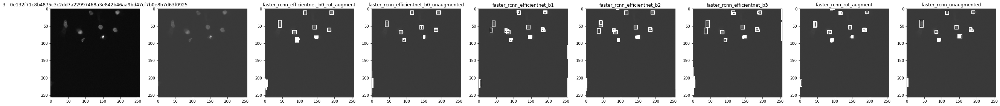

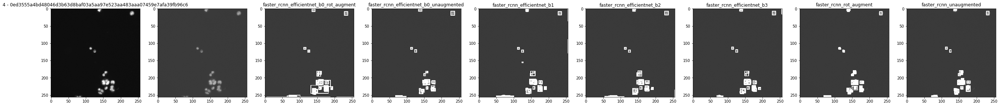

...

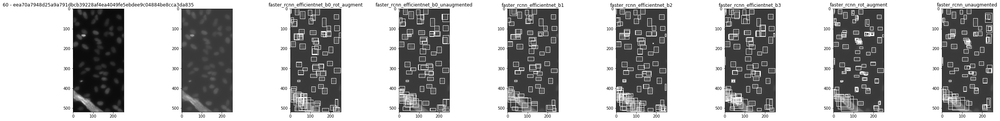

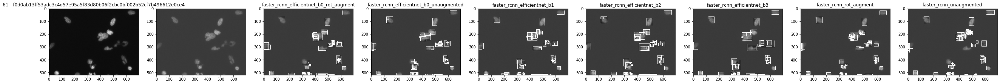

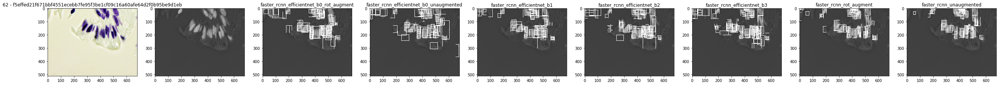

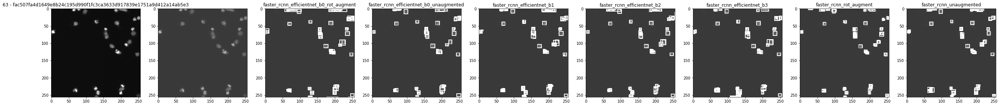

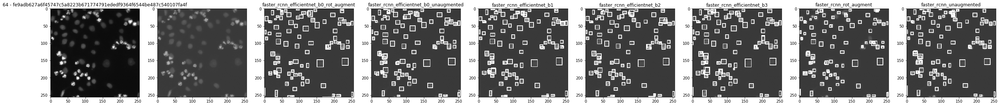

In [0]:
visualizations = defaultdict(dict)
visualizations_path = summary_path / "ds_test_visualizations"
visualizations_path.mkdir(exist_ok=True)

for model_name, predictions in models_predictions.items():
  for (
      example_input, example_output
    ) in predictions:

    example_original = [e for e in ds_test.examples if e.id == example_input.id][0]
    visualizations[example_input.id]["original"] = example_original
    visualizations[example_input.id]["input"] = example_input
    visualizations[example_input.id][model_name] = example_output


for img_id, vis in visualizations.items():
  fig, ax = plt.subplots(ncols=len(vis), figsize=(5 * len(vis), 5))
  
  example_name =vis["original"].name 
  ax[0].imshow(vis["original"].vis_boxes())
  ax[0].set_title(f"{img_id} - {example_name}")
  ax[1].imshow(vis["input"].vis_boxes())
  for i, (model_name, output) in enumerate(
      [(k,v) for (k,v) in sorted(vis.items()) if k not in ["original", "input"] ]
      ):
    ax[i+2].imshow(output.vis_boxes())
    ax[i+2].set_title(model_name)
  fig.savefig(visualizations_path / f"{example_name}.png")